## Customer Segmentation and LTV Prediction

In this section, we try to do customer segmentation with RFM (Recency, Frequency and Monetary Value) scores. Since we have the data for the whole year of 2017, we seperate it into two sets: January-September and Octobor-December. Then we will do customer segmentation for the first 9 months and predict the customer life time value (LTV) for the last 3 months.

**Customer Segmentation (First 9 Months)** <br>
We calculate the recency (how many days past since the last transaction), frequency (how many transactions within 9 months) and log revenue for all transactions. Then we do clustering for these 3 features so that we have 3 clustering features. We re-order the cluster order the make the biggest cluster number represents the best results. Thus, we calculate the overall score by summing up these 3 scores. Then we segment the customer into 4 groups according to the overall scores.

**LTV Prediction (Last 3 Months)**  <br>
First, we use the log revenue of the last 3 months to do a LTV clustering. Then we use the 9-month features to predict the 3-month LTV.

In [1]:
from __future__ import division
from datetime import datetime, timedelta,date
import pandas as pd
%matplotlib inline
from sklearn.metrics import classification_report,confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

import xgboost as xgb
from sklearn.model_selection import KFold, cross_val_score, train_test_split

import warnings
warnings.filterwarnings("ignore")

pyoff.init_notebook_mode()

In [2]:
os.chdir('../../')

os.getcwd()

'C:\\Users\\betty\\OneDrive\\Documents\\GitHub\\theme\\Google-Store-Analytics-Transactions-Revenue-Prediction'

In [3]:
# read the data
path = 'dataset/clean_data/'

# load data
df = pd.read_pickle('2017_clean.pkl')
train = df.copy()

In [4]:
# keep related information and change data type
train = train[['fullVisitorId', 'date', 'totals.totalTransactionRevenue']]
train["date"] = pd.to_datetime(train["date"], format="%Y%m%d") # seting the column as pandas datetime
train['totals.totalTransactionRevenue']=train['totals.totalTransactionRevenue'].astype('float')

In [5]:
train.head()

,fullVisitorId,date,totals.totalTransactionRevenue
0,3162355547410993243,2017-10-16,NaN
1,8934116514970143966,2017-10-16,NaN
2,7992466427990357681,2017-10-16,NaN
3,9075655783635761930,2017-10-16,NaN
4,6960673291025684308,2017-10-16,NaN


In [6]:
train['date'].describe()

count                  928860
unique                    365
top       2017-12-12 00:00:00
freq                     9234
first     2017-01-01 00:00:00
last      2017-12-31 00:00:00
Name: date, dtype: object

In [7]:
# select data from Jan to Sept
train_9 = train[(train.date < date(2017,10,1)) & (train.date >= date(2017,1,1))].reset_index(drop=True)
# select data from Oct to Dec
train_12 = train[(train.date >= date(2017,10,1)) & (train.date <= date(2017,12,31))].reset_index(drop=True)

In [8]:
train_9['date'].describe()

count                  636781
unique                    273
top       2017-09-20 00:00:00
freq                     4880
first     2017-01-01 00:00:00
last      2017-09-30 00:00:00
Name: date, dtype: object

In [9]:
train_12['date'].describe()

count                  292079
unique                     92
top       2017-12-12 00:00:00
freq                     9234
first     2017-10-01 00:00:00
last      2017-12-31 00:00:00
Name: date, dtype: object

In [10]:
customer = pd.DataFrame(train['fullVisitorId'].unique())
customer.columns = ['fullVisitorId']

### Recency

In [11]:
max_purchase = train_9.groupby('fullVisitorId').date.max().reset_index()

In [12]:
max_purchase.columns = ['fullVisitorId','MaxPurchaseDate']

In [13]:
max_purchase['Recency'] = (max_purchase['MaxPurchaseDate'].max() - max_purchase['MaxPurchaseDate']).dt.days

In [14]:
user_recency = pd.merge(customer, max_purchase[['fullVisitorId','Recency']], on='fullVisitorId')

In [15]:
user_recency.head()

,fullVisitorId,Recency
0,8934116514970143966,4
1,6135613929977117121,1
2,9630953897602496525,19
3,8461088577726398196,14
4,8574773000077178719,136


In [16]:
user_recency.Recency.describe()

count    495989.000000
mean        127.851523
std          80.999227
min           0.000000
25%          54.000000
50%         126.000000
75%         198.000000
max         272.000000
Name: Recency, dtype: float64

In [17]:
plot_data = [
    go.Histogram(
        x=user_recency['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

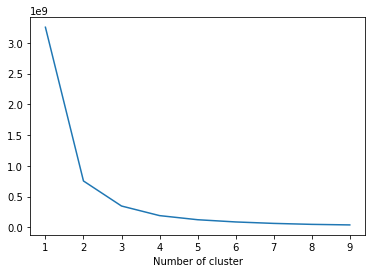

In [18]:
# Elbow Method
sse={}
recency = user_recency[['Recency']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(recency)
    recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [19]:
# let's try 4 first
kmeans = KMeans(n_clusters=4)
kmeans.fit(user_recency[['Recency']])
user_recency['RecencyCluster'] = kmeans.predict(user_recency[['Recency']])

In [20]:
user_recency.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,122078.0,167.864210,20.326261,132.0,151.0,169.0,185.0,202.0
1,116446.0,95.801110,19.772158,63.0,79.0,94.0,113.0,131.0
2,116766.0,236.708854,19.870417,203.0,220.0,236.0,253.0,272.0
3,140699.0,29.319469,18.341870,0.0,12.0,29.0,45.0,62.0


In [21]:
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

In [22]:
# call the funtion above to order cluster
user_recency = order_cluster('RecencyCluster', 'Recency', user_recency,False)

In [23]:
user_recency.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,116766.0,236.708854,19.870417,203.0,220.0,236.0,253.0,272.0
1,122078.0,167.864210,20.326261,132.0,151.0,169.0,185.0,202.0
2,116446.0,95.801110,19.772158,63.0,79.0,94.0,113.0,131.0
3,140699.0,29.319469,18.341870,0.0,12.0,29.0,45.0,62.0


In [24]:
user_recency.groupby('RecencyCluster')['Recency'].agg(['count','mean']).reset_index()

,RecencyCluster,count,mean
0,0,116766,236.708854
1,1,122078,167.864210
2,2,116446,95.801110
3,3,140699,29.319469


Text(0.5, 1.0, 'Recency_Cluster')

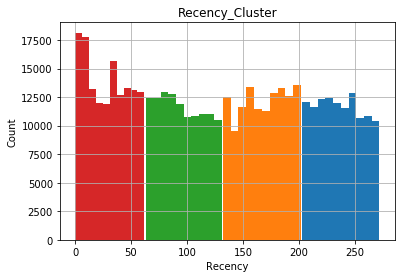

In [25]:
user_recency.groupby('RecencyCluster')['Recency'].hist()
plt.xlabel('Recency')
plt.ylabel('Count')
plt.title('Recency_Cluster')

### Frequency

In [26]:
user_frequency = train_9.groupby('fullVisitorId').date.count().reset_index()

In [27]:
user_frequency.columns = ['fullVisitorId','Frequency']

In [28]:
user_frequency.head()

,fullVisitorId,Frequency
0,0000027376579751715,1
1,0000039460501403861,1
2,0000040862739425590,2
3,0000049363351866189,3
4,0000062267706107999,1


In [29]:
user = pd.merge(user_recency, user_frequency, on='fullVisitorId')

In [30]:
user.head()

,fullVisitorId,Recency,RecencyCluster,Frequency
0,8934116514970143966,4,3,3
1,6135613929977117121,1,3,6
2,9630953897602496525,19,3,1
3,8461088577726398196,14,3,3
4,7122741899604173060,2,3,2


In [31]:
user.Frequency.describe()

count    495989.000000
mean          1.283861
std           1.337847
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max         195.000000
Name: Frequency, dtype: float64

In [32]:
plot_data = [
    go.Histogram(
        x=user['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

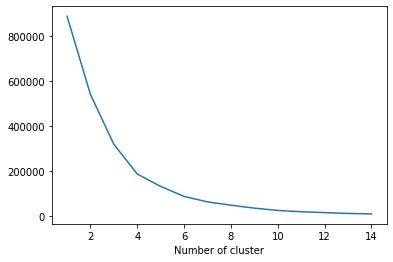

In [33]:
# Elbow Method
sse={}
frequency = user[['Frequency']]
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(frequency)
    frequency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [34]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(user[['Frequency']])
user['FrequencyCluster'] = kmeans.predict(user[['Frequency']])

In [35]:
user = order_cluster('FrequencyCluster', 'Frequency',user,True)

In [36]:
user.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,470010.0,1.097385,0.296482,1.0,1.00,1.0,1.00,2.0
1,24239.0,3.903379,1.269582,3.0,3.00,3.0,4.00,8.0
2,1706.0,13.691676,6.131206,9.0,10.00,12.0,15.00,51.0
3,34.0,89.029412,33.107250,54.0,64.25,81.5,101.25,195.0


In [37]:
user.groupby('FrequencyCluster')['Frequency'].agg(['count','mean']).reset_index()

,FrequencyCluster,count,mean
0,0,470010,1.097385
1,1,24239,3.903379
2,2,1706,13.691676
3,3,34,89.029412


### Monetary Value

In [38]:
revenue = train_9.groupby('fullVisitorId')['totals.totalTransactionRevenue'].sum().reset_index()

In [39]:
revenue.columns = ['fullVisitorId', 'Revenue']
revenue['logRevenue'] = np.log(1+revenue['Revenue'])
revenue = revenue.drop(['Revenue'], axis=1)
revenue.head()

,fullVisitorId,logRevenue
0,0000027376579751715,0.0
1,0000039460501403861,0.0
2,0000040862739425590,0.0
3,0000049363351866189,0.0
4,0000062267706107999,0.0


In [40]:
user = pd.merge(user, revenue, on='fullVisitorId')
user.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue
0,8934116514970143966,4,3,3,1,16.612182
1,6135613929977117121,1,3,6,1,0.000000
2,8461088577726398196,14,3,3,1,0.000000
3,9056866253625889952,2,3,8,1,0.000000
4,1858833000939214139,1,3,4,1,0.000000


In [41]:
user.logRevenue.describe()

count    495989.000000
mean          0.264691
std           2.167142
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          25.966048
Name: logRevenue, dtype: float64

In [42]:
# the elbow method show 2
kmeans = KMeans(n_clusters=2)
kmeans.fit(user[['logRevenue']])
user['logRevenueCluster'] = kmeans.predict(user[['logRevenue']])

In [43]:
user = order_cluster('logRevenueCluster', 'logRevenue',user,True)

In [44]:
user.groupby('logRevenueCluster')['logRevenue'].describe()

,count,mean,std,min,25%,50%,75%,max
logRevenueCluster,,,,,,,,
0,488670.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,7319.0,17.937419,1.125177,14.731802,17.147358,17.746355,18.515718,25.966048


In [45]:
user.groupby('logRevenueCluster')['logRevenue'].agg(['count','mean']).reset_index()

,logRevenueCluster,count,mean
0,0,488670,0.000000
1,1,7319,17.937419


### Overall Segmentation

In [46]:
user.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster
0,8934116514970143966,4,3,3,1,16.612182,1
1,0012276352424581690,16,3,5,1,17.804124,1
2,9179364299608933418,8,3,3,1,19.412153,1
3,3700714855829972615,5,3,8,1,19.586889,1
4,5334896187622326438,6,3,4,1,17.281246,1


In [47]:
user['OverallScore'] = user['RecencyCluster'] + user['FrequencyCluster'] + user['logRevenueCluster']

In [48]:
user.groupby('OverallScore')['Recency','Frequency','logRevenue'].mean().reset_index()

,OverallScore,Recency,Frequency,logRevenue
0,0,236.827423,1.082989,0.000000
1,1,170.675339,1.182395,0.120642
2,2,100.204518,1.248871,0.242966
3,3,33.487005,1.251690,0.225502
4,4,36.282251,4.028941,3.667626
5,5,34.091191,8.859801,12.023915
6,6,26.031963,21.538813,17.207364
7,7,14.000000,130.200000,19.778151


Looks like overall score 7 is the highest value customer.

In [49]:
user['Segment'] = 'Low-Value'
user.loc[user['OverallScore']>0,'Segment'] = 'Mid1-Value' 
user.loc[user['OverallScore']>3,'Segment'] = 'Mid2-Value' 
user.loc[user['OverallScore']>5,'Segment'] = 'High-Value' 

In [50]:
sg = user.groupby('Segment')['logRevenue'].agg(['count','mean']).sort_values(by=['mean']).reset_index()
sg.columns = ['Segment','count','mean_logRevenue_9']
sg

,Segment,count,mean_logRevenue_9
0,Low-Value,111388,0.000000
1,Mid1-Value,373401,0.197349
2,Mid2-Value,10976,4.894880
3,High-Value,224,17.264748


In [51]:
user_sample = user.sample(20000)

In [52]:
tx_graph = user_sample

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid1-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid1-Value'")['Frequency'],
        mode='markers',
        name='Mid1',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
            go.Scatter(
        x=tx_graph.query("Segment == 'Mid2-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid2-Value'")['Frequency'],
        mode='markers',
        name='Mid2',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'orange',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [53]:
tx_graph = user_sample

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Low-Value'")['logRevenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid1-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid1-Value'")['logRevenue'],
        mode='markers',
        name='Mid1',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
            go.Scatter(
        x=tx_graph.query("Segment == 'Mid2-Value'")['Recency'],
        y=tx_graph.query("Segment == 'Mid2-Value'")['logRevenue'],
        mode='markers',
        name='Mid2',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'orange',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Recency'],
        y=tx_graph.query("Segment == 'High-Value'")['logRevenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "logRevenue"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [30]:
tx_graph = user_sample

plot_data = [
    go.Scatter(
        x=tx_graph.query("Segment == 'Low-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Low-Value'")['logRevenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'Mid1-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Mid1-Value'")['logRevenue'],
        mode='markers',
        name='Mid1',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
            go.Scatter(
        x=tx_graph.query("Segment == 'Mid2-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'Mid2-Value'")['logRevenue'],
        mode='markers',
        name='Mid2',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'orange',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=tx_graph.query("Segment == 'High-Value'")['Frequency'],
        y=tx_graph.query("Segment == 'High-Value'")['logRevenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "logRevenue"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

NameError: name 'user_sample' is not defined

### Life Time Value Prediction

In [55]:
user.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,Segment
0,8934116514970143966,4,3,3,1,16.612182,1,5,Mid2-Value
1,0012276352424581690,16,3,5,1,17.804124,1,5,Mid2-Value
2,9179364299608933418,8,3,3,1,19.412153,1,5,Mid2-Value
3,3700714855829972615,5,3,8,1,19.586889,1,5,Mid2-Value
4,5334896187622326438,6,3,4,1,17.281246,1,5,Mid2-Value


In [56]:
train_12.head()

,fullVisitorId,date,totals.totalTransactionRevenue
0,3162355547410993243,2017-10-16,NaN
1,8934116514970143966,2017-10-16,NaN
2,7992466427990357681,2017-10-16,NaN
3,9075655783635761930,2017-10-16,NaN
4,6960673291025684308,2017-10-16,NaN


In [57]:
revenue_12 = train_12.groupby('fullVisitorId')['totals.totalTransactionRevenue'].sum().reset_index()
revenue_12.columns = ['fullVisitorId','Revenue_12']
revenue_12['logRevenue_12'] = np.log(1+revenue_12['Revenue_12'])
revenue_12 = revenue_12.drop(['Revenue_12'], axis=1)

In [58]:
revenue_12.head()

,fullVisitorId,logRevenue_12
0,0000000259678714014,0.0
1,0000117255350596610,0.0
2,0000118334805178127,0.0
3,000020731284570628,0.0
4,0000232022622082281,0.0


In [59]:
# merge 9-month features with 3-month revenue
merge = pd.merge(user, revenue_12, on='fullVisitorId', how='left')

In [60]:
merge.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,Segment,logRevenue_12
0,8934116514970143966,4,3,3,1,16.612182,1,5,Mid2-Value,16.950570
1,0012276352424581690,16,3,5,1,17.804124,1,5,Mid2-Value,21.522470
2,9179364299608933418,8,3,3,1,19.412153,1,5,Mid2-Value,0.000000
3,3700714855829972615,5,3,8,1,19.586889,1,5,Mid2-Value,17.527862
4,5334896187622326438,6,3,4,1,17.281246,1,5,Mid2-Value,0.000000


In [61]:
merge = merge.fillna(0)

In [62]:
sg_12 = merge.groupby('Segment')['logRevenue_12'].agg(['count','mean']).sort_values(by=['mean']).reset_index()
sg_12.columns = ['Segment','count','mean_logRevenue_12']
sg_12

,Segment,count,mean_logRevenue_12
0,Low-Value,111388,0.000311
1,Mid1-Value,373401,0.005760
2,Mid2-Value,10976,0.188911
3,High-Value,224,1.734390


In [63]:
merge.shape

(495989, 10)

In [64]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(merge[['logRevenue_12']])
merge['LTVCluster'] = kmeans.predict(merge[['logRevenue_12']])

In [65]:
merge = order_cluster('LTVCluster', 'logRevenue_12',merge,True)

In [66]:
merge.groupby('LTVCluster')['logRevenue_12'].describe()

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,495733.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,112.0,17.055235,0.548509,14.731802,16.713340,17.148251,17.510059,17.719300
2,98.0,18.394497,0.398253,17.779746,18.025636,18.310745,18.755153,19.266077
3,46.0,20.319989,0.595112,19.396183,19.912267,20.279084,20.712651,21.578307


In [67]:
ltv = merge.groupby('LTVCluster')['logRevenue_12'].agg(['count','mean']).reset_index()
ltv.columns = ['LTVCluster','count','mean_logRevenue_12']
ltv

,LTVCluster,count,mean_logRevenue_12
0,0,495733,0.000000
1,1,112,17.055235
2,2,98,18.394497
3,3,46,20.319989


In [68]:
cluster = merge.copy()

In [69]:
cluster.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,Segment,logRevenue_12,LTVCluster
0,8934116514970143966,4,3,3,1,16.612182,1,5,Mid2-Value,16.950570,1
1,3700714855829972615,5,3,8,1,19.586889,1,5,Mid2-Value,17.527862,1
2,0267692164162304307,19,3,3,1,16.165933,1,5,Mid2-Value,17.599018,1
3,4921798700570421930,59,3,5,1,17.087358,1,5,Mid2-Value,17.001863,1
4,1956114514458489728,0,3,6,1,17.656467,1,5,Mid2-Value,16.498585,1


In [70]:
# dummy Segment
cluster['Segment_High']=0
cluster.loc[cluster['Segment']=='High-Value','Segment_High']=1
cluster['Segment_Mid1']=0
cluster.loc[cluster['Segment']=='Mid1-Value','Segment_Mid1']=1
cluster['Segment_Mid2']=0
cluster.loc[cluster['Segment']=='Mid2-Value','Segment_Mid2']=1
cluster['Segment_Low']=0
cluster.loc[cluster['Segment']=='Low-Value','Segment_Low']=1

In [71]:
cluster = cluster.drop(['Segment'],axis=1)
cluster.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,logRevenue_12,LTVCluster,Segment_High,Segment_Mid1,Segment_Mid2,Segment_Low
0,8934116514970143966,4,3,3,1,16.612182,1,5,16.950570,1,0,0,1,0
1,3700714855829972615,5,3,8,1,19.586889,1,5,17.527862,1,0,0,1,0
2,0267692164162304307,19,3,3,1,16.165933,1,5,17.599018,1,0,0,1,0
3,4921798700570421930,59,3,5,1,17.087358,1,5,17.001863,1,0,0,1,0
4,1956114514458489728,0,3,6,1,17.656467,1,5,16.498585,1,0,0,1,0


In [72]:
# corelation with 3-month (Oct-Dec) LTVCluster
corr_matrix = cluster.corr()
corr_matrix['LTVCluster'].sort_values(ascending=False)

LTVCluster           1.000000
logRevenue_12        0.942943
Segment_High         0.090010
logRevenue           0.076189
logRevenueCluster    0.071305
Frequency            0.065218
Segment_Mid2         0.063452
FrequencyCluster     0.049142
OverallScore         0.039313
RecencyCluster       0.022806
Segment_Low         -0.011026
Segment_Mid1        -0.015405
Recency             -0.025665
Name: LTVCluster, dtype: float64

### Building Model (lightGBM)

In [73]:
X = cluster.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1)
y = cluster['LTVCluster']

In [74]:
X_columns = cluster.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1).columns
y_column = ['LTVCluster']

In [75]:
import lightgbm as lgb
from imblearn.over_sampling import SMOTE

In [76]:
# using SMOTE for unbalanced data
X, y= SMOTE().fit_resample(X, y)

In [77]:
# change X, y to dataframe so that we can keep column names
tX = pd.DataFrame(X, columns=X_columns)
ty = pd.DataFrame(y, columns=y_column)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002114B4E7C88>]],
      dtype=object)

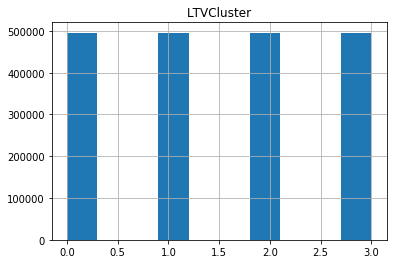

In [78]:
# take a look at y after SMOTE, 4 clusters have the same samples now
ty.hist()

In [79]:
X_train, X_test, y_train, y_test = train_test_split(tX, ty, test_size=0.2, random_state=56)

In [80]:
# fitting lightGBM
params = {"objective" : "multiclass",
          "num_class": 4,
          "metric" : "multi_error",
          "num_leaves" : 30,
          "min_child_weight" : 50,
          "learning_rate" : 0.1,
          "bagging_fraction" : 0.7,
          "feature_fraction" : 0.7,
          "reg_alpha": 0.15,
          "reg_lambda": 0.15,
          "min_child_weight": 50,
          "bagging_seed" : 420,
          "verbosity" : -1
         }
lg_train = lgb.Dataset(X_train, label=y_train)
lg_test = lgb.Dataset(X_test, label=y_test)
model = lgb.train(params, lg_train, 1000, valid_sets=[lg_test], early_stopping_rounds=50, verbose_eval=100)

Training until validation scores don't improve for 50 rounds.
[100]	valid_0's multi_error: 0.135794
[200]	valid_0's multi_error: 0.112646
[300]	valid_0's multi_error: 0.102742
[400]	valid_0's multi_error: 0.0954671
[500]	valid_0's multi_error: 0.0921009
[600]	valid_0's multi_error: 0.0904114
[700]	valid_0's multi_error: 0.0886792
[800]	valid_0's multi_error: 0.0868864
[900]	valid_0's multi_error: 0.0853104
[1000]	valid_0's multi_error: 0.0845666
Did not meet early stopping. Best iteration is:
[996]	valid_0's multi_error: 0.084564


In [81]:
y_pred = model.predict(X_test)

In [82]:
y_pred[0]

array([4.40159694e-06, 9.31897446e-01, 1.41229100e-02, 5.39752420e-02])

In [83]:
# change y_pred format by select the index of maximum probability
y_pred_list = [int(np.where(i == np.amax(i))[0]) for i in y_pred]
y_pred_ar = np.array(y_pred_list)
y_pred_ar

array([1, 0, 2, ..., 0, 2, 0])

In [84]:
print(classification_report(y_test, y_pred_ar))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     98840
           1       0.90      0.86      0.88     99469
           2       0.93      0.89      0.91     99136
           3       0.96      0.95      0.95     99142

    accuracy                           0.92    396587
   macro avg       0.92      0.92      0.92    396587
weighted avg       0.92      0.92      0.92    396587



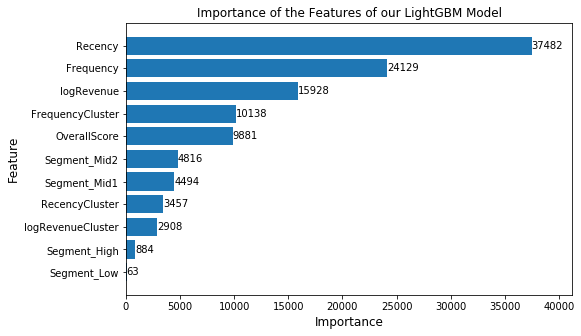

In [85]:
fig, ax = plt.subplots(figsize=(8,5))
lgb.plot_importance(model, height=0.8, ax=ax)
ax.grid(False)
plt.ylabel('Feature', size=12)
plt.xlabel('Importance', size=12)
plt.title("Importance of the Features of our LightGBM Model", fontsize=12)
plt.show()

### Adding Features

#### 1. Continent

In [86]:
ft = df.copy()
ft["date"] = pd.to_datetime(ft["date"], format="%Y%m%d")
# select data from Jan to Sept
ft = ft[(ft.date < date(2017,10,1)) & (ft.date >= date(2017,1,1))].reset_index(drop=True)
ft.shape

(636781, 38)

In [87]:
ft1 = ft[['fullVisitorId','geoNetwork.continent']]
ft1 = ft1.join(pd.get_dummies(ft1['geoNetwork.continent'])).drop(['(not set)'],axis = 1).drop(['geoNetwork.continent'], axis=1)

ft1 = ft1.groupby(['fullVisitorId']).agg(['max'])
ft1.columns = ['_'.join(col).strip() for col in ft1.columns.values]
ft1 = ft1.reset_index()

ft1.head()

,fullVisitorId,Africa_max,Americas_max,Asia_max,Europe_max,Oceania_max
0,0000027376579751715,0,1,0,0,0
1,0000039460501403861,0,1,0,0,0
2,0000040862739425590,0,1,0,0,0
3,0000049363351866189,0,0,1,0,0
4,0000062267706107999,0,1,0,0,0


In [88]:
# merge continent features with cluster
ft1_df = pd.merge(cluster, ft1, on='fullVisitorId')
ft1_df.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,logRevenue_12,LTVCluster,Segment_High,Segment_Mid1,Segment_Mid2,Segment_Low,Africa_max,Americas_max,Asia_max,Europe_max,Oceania_max
0,8934116514970143966,4,3,3,1,16.612182,1,5,16.950570,1,0,0,1,0,0,1,0,0,0
1,3700714855829972615,5,3,8,1,19.586889,1,5,17.527862,1,0,0,1,0,0,1,0,0,0
2,0267692164162304307,19,3,3,1,16.165933,1,5,17.599018,1,0,0,1,0,0,1,0,0,0
3,4921798700570421930,59,3,5,1,17.087358,1,5,17.001863,1,0,0,1,0,0,1,0,0,0
4,1956114514458489728,0,3,6,1,17.656467,1,5,16.498585,1,0,0,1,0,0,1,0,0,0


In [89]:
X = ft1_df.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1)
y = ft1_df['LTVCluster']

In [90]:
X_columns = ft1_df.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1).columns
y_column = ['LTVCluster']

In [91]:
# using SMOTE for unbalanced data
X, y= SMOTE().fit_resample(X, y)

In [92]:
# change X, y to dataframe so that we can keep column names
tX = pd.DataFrame(X, columns=X_columns)
ty = pd.DataFrame(y, columns=y_column)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002114F378400>]],
      dtype=object)

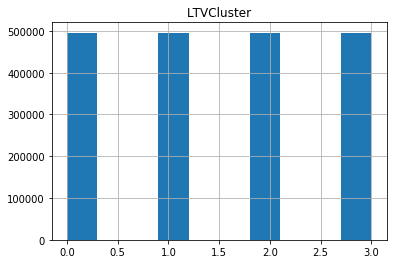

In [93]:
# take a look at y after SMOTE, 4 clusters have the same samples now
ty.hist()

In [94]:
X_train, X_test, y_train, y_test = train_test_split(tX, ty, test_size=0.2, random_state=56)

In [95]:
# fitting lightGBM
params = {"objective" : "multiclass",
          "num_class": 4,
          "metric" : "multi_error",
          "num_leaves" : 30,
          "min_child_weight" : 50,
          "learning_rate" : 0.1,
          "bagging_fraction" : 0.7,
          "feature_fraction" : 0.7,
          "reg_alpha": 0.15,
          "reg_lambda": 0.15,
          "min_child_weight": 50,
          "bagging_seed" : 420,
          "verbosity" : -1
         }
lg_train = lgb.Dataset(X_train, label=y_train)
lg_test = lgb.Dataset(X_test, label=y_test)
model = lgb.train(params, lg_train, 1000, valid_sets=[lg_test], early_stopping_rounds=50, verbose_eval=100)

Training until validation scores don't improve for 50 rounds.
[100]	valid_0's multi_error: 0.12334
[200]	valid_0's multi_error: 0.102941
[300]	valid_0's multi_error: 0.0898365
[400]	valid_0's multi_error: 0.0848389
[500]	valid_0's multi_error: 0.079289
[600]	valid_0's multi_error: 0.076064
[700]	valid_0's multi_error: 0.0737619
[800]	valid_0's multi_error: 0.072307
[900]	valid_0's multi_error: 0.0711445
[1000]	valid_0's multi_error: 0.0701914
Did not meet early stopping. Best iteration is:
[991]	valid_0's multi_error: 0.0701914


In [96]:
y_pred = model.predict(X_test)

In [97]:
y_pred[0]

array([1.39717059e-05, 9.96990504e-01, 2.97112017e-03, 2.44040701e-05])

In [98]:
# change y_pred format by select the index of maximum probability
y_pred_list = [int(np.where(i == np.amax(i))[0]) for i in y_pred]
y_pred_ar = np.array(y_pred_list)
y_pred_ar

array([1, 2, 2, ..., 0, 2, 0])

In [99]:
print(classification_report(y_test, y_pred_ar))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93     98840
           1       0.92      0.88      0.90     99469
           2       0.92      0.95      0.93     99136
           3       0.96      0.95      0.95     99142

    accuracy                           0.93    396587
   macro avg       0.93      0.93      0.93    396587
weighted avg       0.93      0.93      0.93    396587



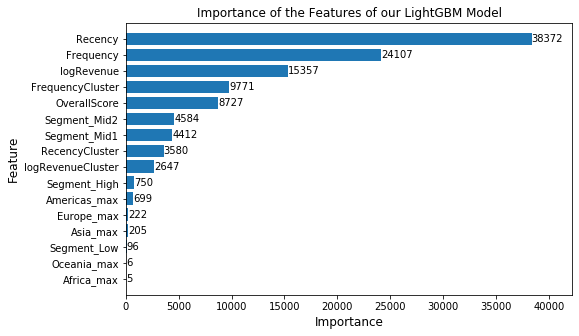

In [100]:
fig, ax = plt.subplots(figsize=(8,5))
lgb.plot_importance(model, height=0.8, ax=ax)
ax.grid(False)
plt.ylabel('Feature', size=12)
plt.xlabel('Importance', size=12)
plt.title("Importance of the Features of our LightGBM Model", fontsize=12)
plt.show()

#### 2. Continent and Country-US

In [101]:
ft2 = ft[['fullVisitorId','geoNetwork.country']]
ft2['country_US']=0
ft2.loc[ft2['geoNetwork.country']=='United States','country_US']=1
ft2 = ft2.drop(['geoNetwork.country'],axis=1)

ft2.head()

,fullVisitorId,country_US
0,1228032379240126503,0
1,1088084052558051564,0
2,3615794190344553521,0
3,8127234129777839476,0
4,7139860291376515793,0


In [102]:
# check whether a customer only stay in US/not in US, but not for both
us = ft2.groupby(['fullVisitorId']).agg(['sum'])
us.columns = ['_'.join(col).strip() for col in us.columns.values]
us = us.reset_index()

us_merge = pd.merge(user_frequency, us, on='fullVisitorId')

us_merge['us_only'] = (us_merge['Frequency']==us_merge['country_US_sum'])
us_merge.loc[us_merge['Frequency']== 1,'us_only']=True
us_merge.loc[us_merge['country_US_sum']== 0,'us_only']=True
us_merge['us_only'] = us_merge['us_only']*1

In [103]:
# number of customer have been both in US and not in US
print(us_merge[us_merge['us_only']==0]['fullVisitorId'].count())

# presentage of customer have been both in US and not in US
print(us_merge[us_merge['us_only']==0]['fullVisitorId'].count()/us_merge.fullVisitorId.count())

1051
0.0021189986068239418


Since majority of people (99.8%) will staying in US not not in US through all the trasaction, we can consider whether in US as a stable attribute for a customer.

In [104]:
ft2 = ft2.groupby(['fullVisitorId']).agg(['max'])
ft2.columns = ['_'.join(col).strip() for col in ft2.columns.values]
ft2 = ft2.reset_index()
ft2.columns = ['fullVisitorId', 'country_US']

ft2.head()

,fullVisitorId,country_US
0,0000027376579751715,1
1,0000039460501403861,0
2,0000040862739425590,1
3,0000049363351866189,0
4,0000062267706107999,0


In [105]:
# merge continent features with cluster
ft2_df = pd.merge(ft1_df, ft2, on='fullVisitorId')
ft2_df.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,logRevenue_12,LTVCluster,Segment_High,Segment_Mid1,Segment_Mid2,Segment_Low,Africa_max,Americas_max,Asia_max,Europe_max,Oceania_max,country_US
0,8934116514970143966,4,3,3,1,16.612182,1,5,16.950570,1,0,0,1,0,0,1,0,0,0,1
1,3700714855829972615,5,3,8,1,19.586889,1,5,17.527862,1,0,0,1,0,0,1,0,0,0,1
2,0267692164162304307,19,3,3,1,16.165933,1,5,17.599018,1,0,0,1,0,0,1,0,0,0,1
3,4921798700570421930,59,3,5,1,17.087358,1,5,17.001863,1,0,0,1,0,0,1,0,0,0,1
4,1956114514458489728,0,3,6,1,17.656467,1,5,16.498585,1,0,0,1,0,0,1,0,0,0,1


In [106]:
X = ft2_df.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1)
y = ft2_df['LTVCluster']

In [107]:
X_columns = ft2_df.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1).columns
y_column = ['LTVCluster']

In [108]:
# using SMOTE for unbalanced data
X, y= SMOTE().fit_resample(X, y)

In [109]:
# change X, y to dataframe so that we can keep column names
tX = pd.DataFrame(X, columns=X_columns)
ty = pd.DataFrame(y, columns=y_column)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002114F40D0B8>]],
      dtype=object)

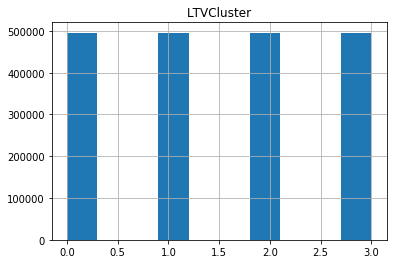

In [110]:
# take a look at y after SMOTE, 4 clusters have the same samples now
ty.hist()

In [111]:
X_train, X_test, y_train, y_test = train_test_split(tX, ty, test_size=0.2, random_state=56)

In [112]:
# fitting lightGBM
params = {"objective" : "multiclass",
          "num_class": 4,
          "metric" : "multi_error",
          "num_leaves" : 30,
          "min_child_weight" : 50,
          "learning_rate" : 0.1,
          "bagging_fraction" : 0.7,
          "feature_fraction" : 0.7,
          "reg_alpha": 0.15,
          "reg_lambda": 0.15,
          "min_child_weight": 50,
          "bagging_seed" : 420,
          "verbosity" : -1
         }
lg_train = lgb.Dataset(X_train, label=y_train)
lg_test = lgb.Dataset(X_test, label=y_test)
model = lgb.train(params, lg_train, 1000, valid_sets=[lg_test], early_stopping_rounds=50, verbose_eval=100)

Training until validation scores don't improve for 50 rounds.
[100]	valid_0's multi_error: 0.116759
[200]	valid_0's multi_error: 0.0929884
[300]	valid_0's multi_error: 0.0838202
[400]	valid_0's multi_error: 0.0768936
[500]	valid_0's multi_error: 0.0741451
[600]	valid_0's multi_error: 0.070968
[700]	valid_0's multi_error: 0.0688626
[800]	valid_0's multi_error: 0.0671026
[900]	valid_0's multi_error: 0.0663864
[1000]	valid_0's multi_error: 0.0658443
Did not meet early stopping. Best iteration is:
[1000]	valid_0's multi_error: 0.0658443


In [113]:
y_pred = model.predict(X_test)

In [114]:
y_pred[0]

array([9.88819487e-05, 9.86993915e-01, 2.90952460e-03, 9.99767817e-03])

In [115]:
# change y_pred format by select the index of maximum probability
y_pred_list = [int(np.where(i == np.amax(i))[0]) for i in y_pred]
y_pred_ar = np.array(y_pred_list)
y_pred_ar

array([1, 0, 2, ..., 0, 2, 0])

In [116]:
print(classification_report(y_test, y_pred_ar))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94     98840
           1       0.93      0.89      0.91     99469
           2       0.92      0.95      0.93     99136
           3       0.96      0.95      0.96     99142

    accuracy                           0.93    396587
   macro avg       0.93      0.93      0.93    396587
weighted avg       0.93      0.93      0.93    396587



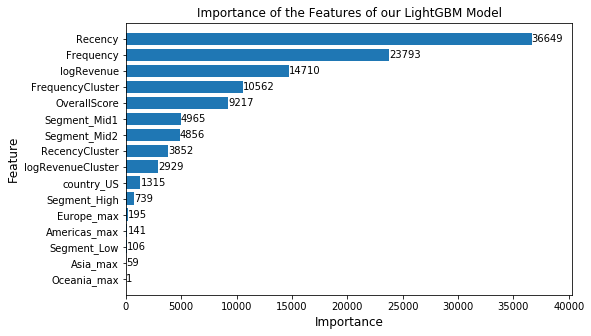

In [117]:
fig, ax = plt.subplots(figsize=(8,5))
lgb.plot_importance(model, height=0.8, ax=ax)
ax.grid(False)
plt.ylabel('Feature', size=12)
plt.xlabel('Importance', size=12)
plt.title("Importance of the Features of our LightGBM Model", fontsize=12)
plt.show()

#### 3. Country-US Only

In [118]:
# merge continent features with cluster
ft_us = pd.merge(cluster, ft2, on='fullVisitorId')
ft_us.head()

,fullVisitorId,Recency,RecencyCluster,Frequency,FrequencyCluster,logRevenue,logRevenueCluster,OverallScore,logRevenue_12,LTVCluster,Segment_High,Segment_Mid1,Segment_Mid2,Segment_Low,country_US
0,8934116514970143966,4,3,3,1,16.612182,1,5,16.950570,1,0,0,1,0,1
1,3700714855829972615,5,3,8,1,19.586889,1,5,17.527862,1,0,0,1,0,1
2,0267692164162304307,19,3,3,1,16.165933,1,5,17.599018,1,0,0,1,0,1
3,4921798700570421930,59,3,5,1,17.087358,1,5,17.001863,1,0,0,1,0,1
4,1956114514458489728,0,3,6,1,17.656467,1,5,16.498585,1,0,0,1,0,1


In [119]:
X = ft_us.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1)
y = ft_us['LTVCluster']

In [120]:
X_columns = ft_us.drop(['LTVCluster','logRevenue_12','fullVisitorId'],axis=1).columns
y_column = ['LTVCluster']

In [121]:
# using SMOTE for unbalanced data
X, y= SMOTE().fit_resample(X, y)

In [122]:
# change X, y to dataframe so that we can keep column names
tX = pd.DataFrame(X, columns=X_columns)
ty = pd.DataFrame(y, columns=y_column)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002114F43AF60>]],
      dtype=object)

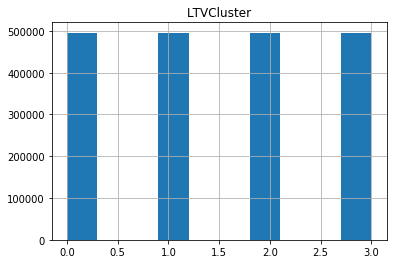

In [123]:
# take a look at y after SMOTE, 4 clusters have the same samples now
ty.hist()

In [124]:
X_train, X_test, y_train, y_test = train_test_split(tX, ty, test_size=0.2, random_state=56)

In [125]:
# fitting lightGBM
params = {"objective" : "multiclass",
          "num_class": 4,
          "metric" : "multi_error",
          "num_leaves" : 30,
          "min_child_weight" : 50,
          "learning_rate" : 0.1,
          "bagging_fraction" : 0.7,
          "feature_fraction" : 0.7,
          "reg_alpha": 0.15,
          "reg_lambda": 0.15,
          "min_child_weight": 50,
          "bagging_seed" : 420,
          "verbosity" : -1
         }
lg_train = lgb.Dataset(X_train, label=y_train)
lg_test = lgb.Dataset(X_test, label=y_test)
model = lgb.train(params, lg_train, 1000, valid_sets=[lg_test], early_stopping_rounds=50, verbose_eval=100)

Training until validation scores don't improve for 50 rounds.
[100]	valid_0's multi_error: 0.116673
[200]	valid_0's multi_error: 0.0930565
[300]	valid_0's multi_error: 0.0833386
[400]	valid_0's multi_error: 0.0780989
[500]	valid_0's multi_error: 0.0744427
[600]	valid_0's multi_error: 0.0710311
[700]	valid_0's multi_error: 0.0694803
[800]	valid_0's multi_error: 0.0676522
[900]	valid_0's multi_error: 0.0666941
[1000]	valid_0's multi_error: 0.0662452
Did not meet early stopping. Best iteration is:
[995]	valid_0's multi_error: 0.0662377


In [126]:
y_pred = model.predict(X_test)

In [127]:
y_pred[0]

array([3.51200281e-01, 6.47974479e-01, 3.61149991e-04, 4.64089751e-04])

In [128]:
# change y_pred format by select the index of maximum probability
y_pred_list = [int(np.where(i == np.amax(i))[0]) for i in y_pred]
y_pred_ar = np.array(y_pred_list)
y_pred_ar

array([1, 0, 2, ..., 0, 0, 0])

In [129]:
print(classification_report(y_test, y_pred_ar))

              precision    recall  f1-score   support

           0       0.93      0.94      0.94     98840
           1       0.93      0.88      0.91     99469
           2       0.92      0.95      0.93     99136
           3       0.96      0.95      0.96     99142

    accuracy                           0.93    396587
   macro avg       0.93      0.93      0.93    396587
weighted avg       0.93      0.93      0.93    396587



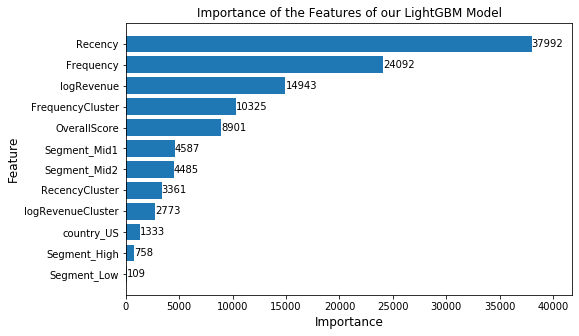

In [130]:
fig, ax = plt.subplots(figsize=(8,5))
lgb.plot_importance(model, height=0.8, ax=ax)
ax.grid(False)
plt.ylabel('Feature', size=12)
plt.xlabel('Importance', size=12)
plt.title("Importance of the Features of our LightGBM Model", fontsize=12)
plt.show()

Adding continent and country_us has the almost the same result as adding country_us only. To avoid overfitting, we will select the third model, adding contry_us only.

In [131]:
from sklearn import metrics
from sklearn.utils.multiclass import unique_labels
class_names=[0,1,2,3] # name  of classes

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=0)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

Confusion matrix, without normalization
[[93362  2369  2728   381]
 [ 3776 87963  4491  3239]
 [ 2316  1780 94386   654]
 [  781  2584  1170 94607]]
Normalized confusion matrix
[[0.93 0.02 0.03 0.  ]
 [0.04 0.93 0.05 0.03]
 [0.02 0.02 0.92 0.01]
 [0.01 0.03 0.01 0.96]]


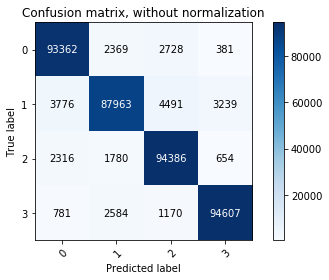

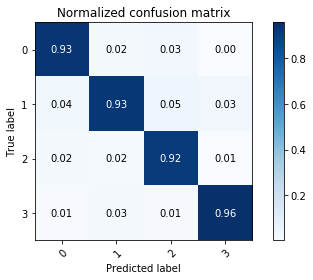

In [132]:
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred_ar, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred_ar, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()